In [1]:
pip install opencv-python numpy pandas matplotlib scikit-learn glob

Note: you may need to restart the kernel to use updated packages.


ERROR: Could not find a version that satisfies the requirement glob (from versions: none)
ERROR: No matching distribution found for glob


In [2]:
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
from glob import glob

# 4.1 - Keypoint detection:

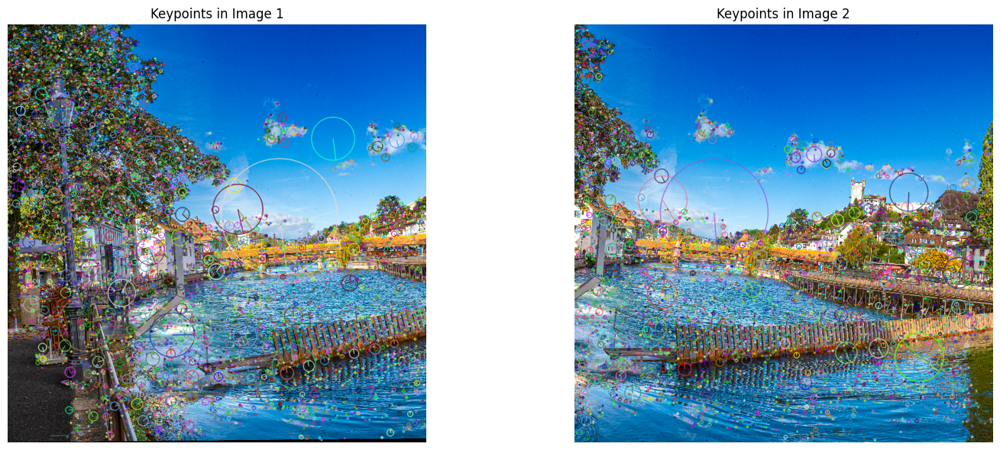

In [3]:
# Load the first two images
image_dir = 'panorama_dataset/'
image_paths = sorted(glob(os.path.join(image_dir, '*.png')))
img1_path, img2_path = image_paths[0], image_paths[1]

img1 = cv2.imread('panorama_dataset/image1.png')
img2 = cv2.imread('panorama_dataset/image2.png')

gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# SIFT
sift = cv2.SIFT_create()

# Detect keypoints and compute descriptors
kp1, des1 = sift.detectAndCompute(gray1, None)
kp2, des2 = sift.detectAndCompute(gray2, None)

# Draw keypoints on images
img1_kp = cv2.drawKeypoints(img1, kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_kp = cv2.drawKeypoints(img2, kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Convert BGR to RGB
img1_kp = cv2.cvtColor(img1_kp, cv2.COLOR_BGR2RGB)
img2_kp = cv2.cvtColor(img2_kp, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 6))

plt.subplot(1, 2, 1)
plt.imshow(img1_kp)
plt.title('Keypoints in Image 1')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(img2_kp)
plt.title('Keypoints in Image 2')
plt.axis('off')

plt.tight_layout()
plt.show()

# 4.2 - Feature matching:

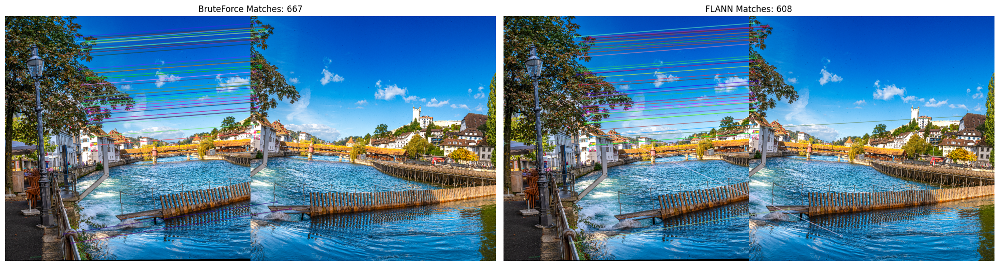

In [4]:
# === BRUTEFORCE MATCHING ===
bf = cv2.BFMatcher()
bf_matches = bf.knnMatch(des1, des2, k=2)

# Apply Lowe's ratio test
bf_good = []
for m, n in bf_matches:
    if m.distance < 0.75 * n.distance:
        bf_good.append(m)

# Draw matches
bf_result = cv2.drawMatches(img1, kp1, img2, kp2, bf_good[:50], None,
                            flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

# === FLANN MATCHING ===
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

flann = cv2.FlannBasedMatcher(index_params, search_params)
flann_matches = flann.knnMatch(des1, des2, k=2)

# Apply Lowe's ratio test
flann_good = []
for m, n in flann_matches:
    if m.distance < 0.7 * n.distance:
        flann_good.append(m)

# Draw matches
flann_result = cv2.drawMatches(img1, kp1, img2, kp2, flann_good[:50], None,
                               flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(20, 10))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(bf_result, cv2.COLOR_BGR2RGB))
plt.title(f"BruteForce Matches: {len(bf_good)}")
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(flann_result, cv2.COLOR_BGR2RGB))
plt.title(f"FLANN Matches: {len(flann_good)}")
plt.axis('off')

plt.tight_layout()
plt.show()

# 4.3 - Homography estimation:

In [5]:
# Compute Homography matrix
if len(bf_good) > 10:
    src_pts = np.float32([kp1[m.queryIdx].pt for m in bf_good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in bf_good]).reshape(-1, 1, 2)

    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    homography_df = pd.DataFrame(H)
    csv_path = "homography_matrix.csv"
    homography_df.to_csv(csv_path, index=False, header=False)

    print(f"Homography matrix saved to {csv_path}")
    print(H)

else:
    print("Not enough matches to estimate homography.")

Homography matrix saved to homography_matrix.csv
[[ 8.99023648e-01 -1.31282351e-01 -1.64442160e+02]
 [ 1.43181983e-01  9.90713800e-01 -6.94375875e+01]
 [-1.27006065e-07  3.60666010e-07  1.00000000e+00]]


# 4.4 - Perspective warping:

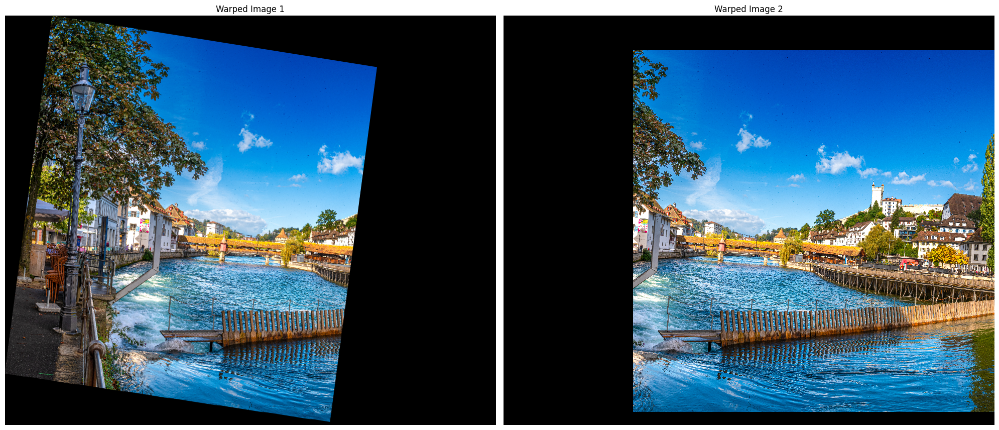

In [6]:
img1 = cv2.imread('panorama_dataset/image1.png')
img2 = cv2.imread('panorama_dataset/image2.png')

# Convert to grayscale
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Detect SIFT keypoints and descriptors
sift = cv2.SIFT_create()
kp1, des1 = sift.detectAndCompute(gray1, None)
kp2, des2 = sift.detectAndCompute(gray2, None)

# BruteForce matcher + Lowe’s ratio test
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)
good = [m for m, n in matches if m.distance < 0.75 * n.distance]

# Warp both images into common space if enough matches
if len(good) > 10:
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]

    # Compute bounding canvas size
    corners_img1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
    corners_img2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
    warped_corners = cv2.perspectiveTransform(corners_img1, H)
    all_corners = np.concatenate((warped_corners, corners_img2), axis=0)

    [xmin, ymin] = np.int32(all_corners.min(axis=0).ravel())
    [xmax, ymax] = np.int32(all_corners.max(axis=0).ravel())
    translation = [-xmin, -ymin]
    warp_size = (xmax - xmin, ymax - ymin)

    # Apply translation matrix
    H_translate = np.array([[1, 0, translation[0]], [0, 1, translation[1]], [0, 0, 1]])

    warped_img1 = cv2.warpPerspective(img1, H_translate @ H, warp_size)
    warped_img2 = np.zeros_like(warped_img1)
    warped_img2[translation[1]:translation[1]+h2, translation[0]:translation[0]+w2] = img2

    plt.figure(figsize=(20, 10))

    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(warped_img1, cv2.COLOR_BGR2RGB))
    plt.title("Warped Image 1")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(warped_img2, cv2.COLOR_BGR2RGB))
    plt.title("Warped Image 2")
    plt.axis('off')

    plt.tight_layout()
    plt.savefig("warped_images.png")
    plt.show()

else:
    print("Not enough good matches to compute homography.")

# 4.5 - Stitching:

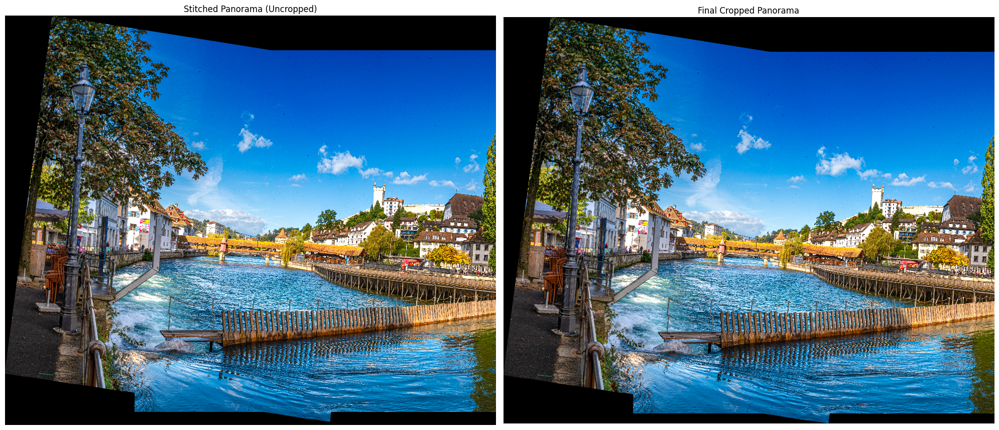

In [7]:
img1 = cv2.imread('panorama_dataset/image1.png')
img2 = cv2.imread('panorama_dataset/image2.png')

# Convert to grayscale for SIFT
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Detect keypoints and descriptors using SIFT
sift = cv2.SIFT_create()
kp1, des1 = sift.detectAndCompute(gray1, None)
kp2, des2 = sift.detectAndCompute(gray2, None)

# BruteForce matcher + Lowe’s ratio test
bf = cv2.BFMatcher()
matches = bf.knnMatch(des1, des2, k=2)
good = [m for m, n in matches if m.distance < 0.75 * n.distance]

if len(good) > 10:
    # Estimate homography using RANSAC
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
    H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]

    # Determine output canvas size
    corners_img1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
    warped_corners = cv2.perspectiveTransform(corners_img1, H)
    corners_img2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)

    all_corners = np.concatenate((warped_corners, corners_img2), axis=0)
    [xmin, ymin] = np.int32(all_corners.min(axis=0).ravel())
    [xmax, ymax] = np.int32(all_corners.max(axis=0).ravel())
    translation = [-xmin, -ymin]
    panorama_size = (xmax - xmin, ymax - ymin)

    # Warp img1 and place img2 on the canvas
    H_translation = np.array([[1, 0, translation[0]], [0, 1, translation[1]], [0, 0, 1]])
    result = cv2.warpPerspective(img1, H_translation @ H, panorama_size)
    result[translation[1]:h2 + translation[1], translation[0]:w2 + translation[0]] = img2

    cv2.imwrite("panorama_uncropped.png", result)

    # Crop out black regions
    gray_result = cv2.cvtColor(result, cv2.COLOR_BGR2GRAY)
    _, thresh = cv2.threshold(gray_result, 1, 255, cv2.THRESH_BINARY)
    contours, _ = cv2.findContours(thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    x, y, w, h = cv2.boundingRect(contours[0])
    cropped = result[y:y + h, x:x + w]
    cv2.imwrite("panorama_cropped.png", cropped)

    plt.figure(figsize=(20, 10))
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
    plt.title("Stitched Panorama (Uncropped)")
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(cropped, cv2.COLOR_BGR2RGB))
    plt.title("Final Cropped Panorama")
    plt.axis('off')

    plt.tight_layout()
    plt.show()

else:
    print("Not enough good matches to compute homography.")

# 4.6 - Multi-Stitching:

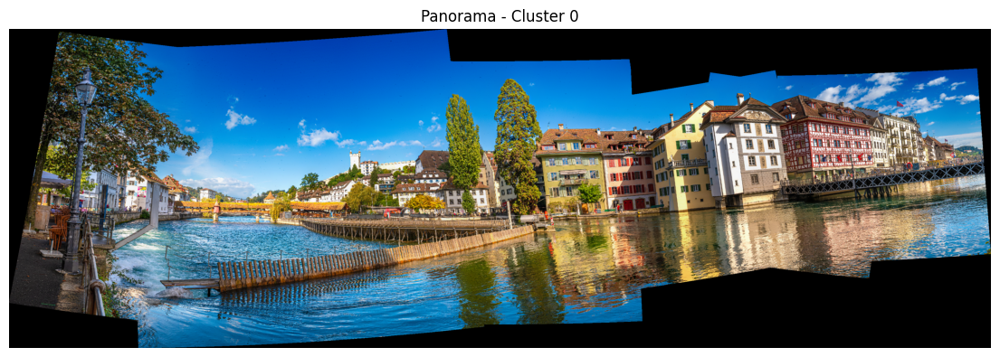

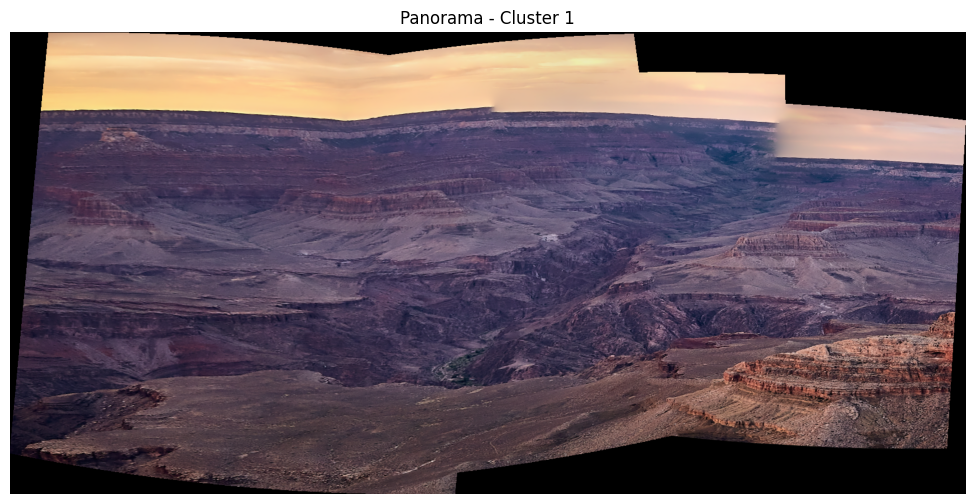

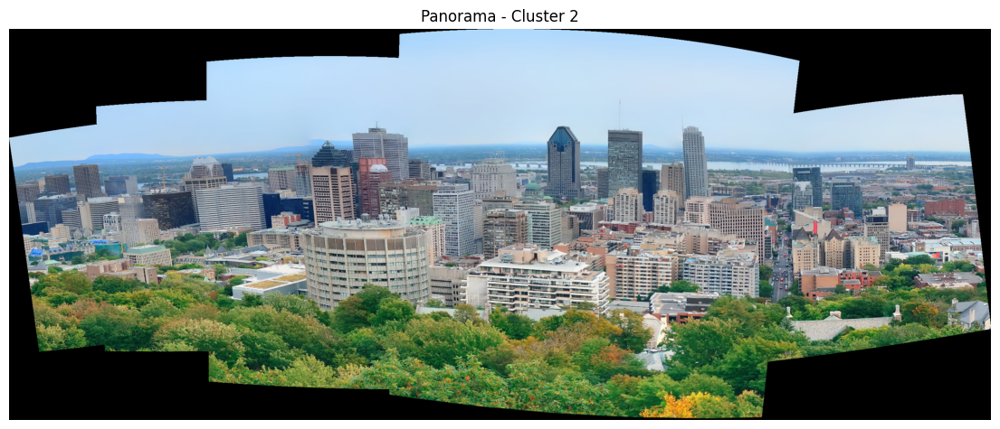

In [ ]:
from sklearn.cluster import KMeans

# === Load and Preprocess Images ===
def load_images(folder):
    images = []
    filenames = sorted(os.listdir(folder))
    for filename in filenames:
        path = os.path.join(folder, filename)
        img = cv2.imread(path)
        if img is not None:
            images.append(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    return images

# === Feature Extraction for Clustering ===
def extract_features(img):
    sift = cv2.SIFT_create()
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    kp, des = sift.detectAndCompute(gray, None)
    return des

def compute_feature_vector(imgs):
    features = []
    for img in imgs:
        des = extract_features(img)
        if des is not None:
            features.append(np.mean(des, axis=0))
        else:
            features.append(np.zeros(128))
    return np.array(features)

# === Manual Stitching Function ===
def stitch_images(images):
    base_img = images[0]
    for i in range(1, len(images)):
        img1 = base_img
        img2 = images[i]

        # Grayscale conversion
        gray1 = cv2.cvtColor(img1, cv2.COLOR_RGB2GRAY)
        gray2 = cv2.cvtColor(img2, cv2.COLOR_RGB2GRAY)

        # SIFT feature detection
        sift = cv2.SIFT_create()
        kp1, des1 = sift.detectAndCompute(gray1, None)
        kp2, des2 = sift.detectAndCompute(gray2, None)

        # Feature matching using BruteForce + Lowe's ratio test
        bf = cv2.BFMatcher()
        matches = bf.knnMatch(des1, des2, k=2)
        good = [m for m, n in matches if m.distance < 0.75 * n.distance]

        if len(good) > 10:
            src_pts = np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
            dst_pts = np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)
            H, _ = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

            h1, w1 = img1.shape[:2]
            h2, w2 = img2.shape[:2]

            # Determine canvas size after warping
            corners_img1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
            warped_corners = cv2.perspectiveTransform(corners_img1, H)
            corners_img2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)

            all_corners = np.concatenate((warped_corners, corners_img2), axis=0)
            [xmin, ymin] = np.int32(all_corners.min(axis=0).ravel())
            [xmax, ymax] = np.int32(all_corners.max(axis=0).ravel())
            translation = [-xmin, -ymin]
            panorama_size = (xmax - xmin, ymax - ymin)

            # Warp and blend
            H_translate = np.array([[1, 0, translation[0]],
                                    [0, 1, translation[1]],
                                    [0, 0, 1]])
            warped_img1 = cv2.warpPerspective(img1, H_translate @ H, panorama_size)

            # Overlay the next image
            warped_img1[translation[1]:translation[1]+h2, translation[0]:translation[0]+w2] = img2
            base_img = warped_img1
        else:
            print(f"Skipping image {i} due to insufficient matches.")
            continue

    return base_img

def plot_panorama(pano, cluster_idx):
    plt.figure(figsize=(14, 6))
    plt.imshow(pano)
    plt.title(f"Panorama - Cluster {cluster_idx}")
    plt.axis('off')
    plt.show()

folder = 'panorama_dataset'
images = load_images(folder)

# Feature extraction
features = compute_feature_vector(images)

# KMeans clustering into 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42)
labels = kmeans.fit_predict(features)

# Group by clusters and stitch
for i in range(3):
    cluster_imgs = [img for idx, img in enumerate(images) if labels[idx] == i]
    if len(cluster_imgs) < 2:
        print(f"Cluster {i} has less than 2 images, skipping.")
        continue
    pano = stitch_images(cluster_imgs)
    if pano is not None:
        plot_panorama(pano, i)